# Вступление

Основная цель моего проекта - исследовать течение вещества между двумя пустотами при изменении параметров вещества. 

Мною были написаны некоторые скрипты, которые делают процесс исследования более удобным и быстрым. В частости, в папке scripts находятся скрипты для запуска юпитера на удаленном узле и проброса портов, скрипты для расчетов lammps, скрипты для запуска telegram бота, который умеет проверять состояние расчетов и присылать графики. В папке data находятся входные и выходные данные lammps, а также графики. 

## Расчеты

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
import plotly.graph_objects as go
import plotly.express as px


In [9]:
Coord_dict={}
currentStep=0
numberParticles=0
walls=[0,0,0]
readTimestep=0
readNAtoms=0
readCell=0
readParticle=0
f = open("./data/dump.obstacle", "r")
n=10
for line in f.readlines():
    line=line[:-1]
    if (line=="ITEM: TIMESTEP"):
        # print("READ1")
        readTimestep=1
        continue
    if readTimestep:
        # print("READ2")
        readTimestep=0
        currentStep=int(line)
        Coord_dict[currentStep]=[]
        continue
    if (line=="ITEM: NUMBER OF ATOMS"):
        readNAtoms=1
        continue
    if readNAtoms:
        readNAtoms=0
        numberParticles=int(line)
        continue
    if (line=="ITEM: BOX BOUNDS pp ss pp"):
        readCell=3
        continue
    if readCell>0:
        readCell-=1
        walls[readCell]=float(line.split()[1])
        continue
    if (line=="ITEM: ATOMS id type xs ys zs"):
        readParticle=numberParticles
        continue
    if readParticle>0:
        readParticle-=1
        Coord_dict[currentStep].append([float(x) for x in line.split()[2:]])
        continue
steps = list(Coord_dict.keys())

In [7]:
df = pd.DataFrame()
for step in steps:
    a = np.array(np.full((numberParticles, ), step))
    arr = np.append(np.array(Coord_dict[step]), a.reshape((1, a.size)).T, axis=1)
    df = df.append(pd.DataFrame(arr), ignore_index=True)
df.columns=['x', 'y', 'z', 'step']

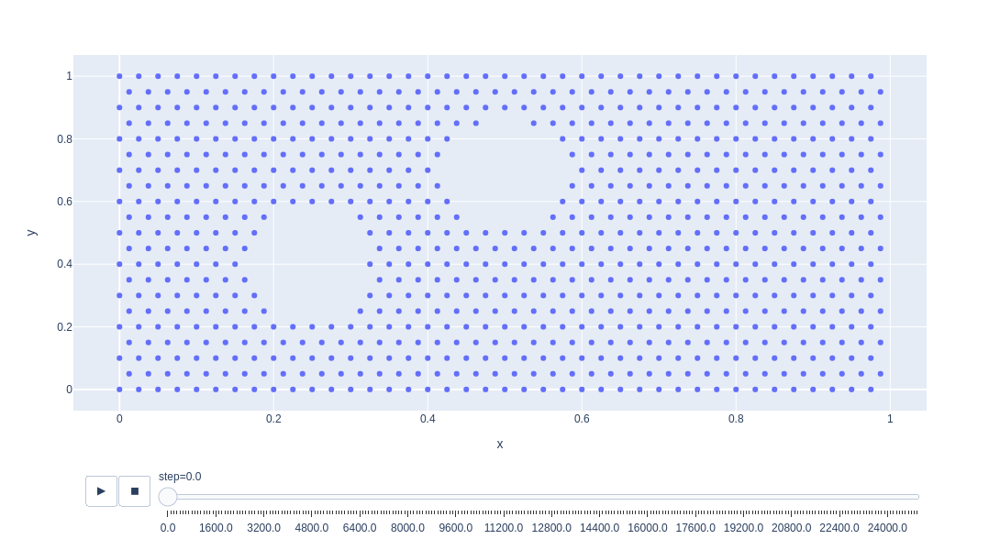

In [10]:
fig = px.scatter(df, x='x', y='y', animation_frame='step', width=600, height=600)
fig.show()

## Telegram бот

### Следующие картинки вы можете получить в telegram боте @simple_project_notifier_bot

![1](data/plots/1.jpg)
![2](data/plots/2.jpg)
![3](data/plots/3.jpg)
![4](data/plots/4.jpg)